# Milestone 2 - Implementation

In [1]:
# importing libraries 
import pandas as pd
import altair as alt
from altair import datum
#alt.data_transformers.enable("default") 
alt.renderers.enable("mimetype")
import warnings
warnings.filterwarnings("ignore")

In [2]:
# reading in dataset
penguins = pd.read_csv('data/penguins_merged.csv')
penguins.head()

,species,island,bill length mm,bill depth mm,flipper length mm,body mass g,sex,diet,life stage,health metrics,year,delta 15 n (o/oo),delta 13 c (o/oo)
0,Adelie,Biscoe,53.4,17.8,219.0,5687.0,female,fish,adult,overweight,2021,8.43951,-25.88156
1,Adelie,Biscoe,49.3,18.1,245.0,6811.0,female,fish,adult,overweight,2021,8.84451,-26.55602
2,Adelie,Biscoe,55.7,16.6,226.0,5388.0,female,fish,adult,overweight,2021,8.41837,-25.19837
3,Adelie,Biscoe,38.0,15.6,221.0,6262.0,female,fish,adult,overweight,2021,8.80967,-25.36288
4,Adelie,Biscoe,60.7,17.9,177.0,4811.0,female,fish,juvenile,overweight,2021,8.08138,-25.81012


## Task A - Evaluating Impact of Diet Types on Physical Characteristics Throughout Life Stages

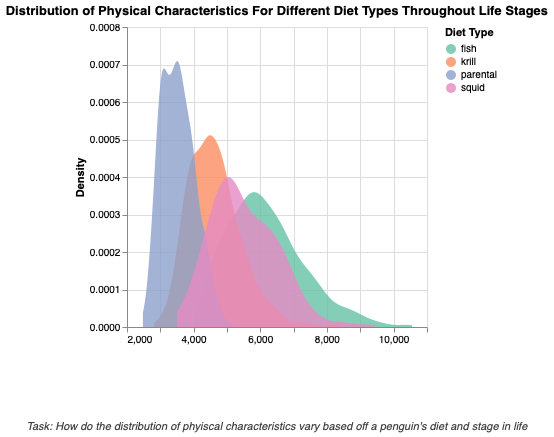

In [3]:
diet_colors = ['#66c2a5','#fc8d62','#8da0cb','#e78ac3']
extra_text_color = '#3d3d3d'

life_stages = ['chick', 'juvenile', 'adult']
labels = ['Chick', 'Juvenille', 'Adult']
stage_radio = alt.binding_radio(
    options=life_stages, labels=labels, name='Life Stage: ')

selection = alt.selection_point(
    fields=['life stage'], 
    bind=stage_radio
)

metric_options = ['bill length mm', 'bill depth mm', 'flipper length mm', 'body mass g']
metric_labels = ['Bill Length (mm)', 'Bill Depth (mm)', 'Flipper Length (mm)', 'Body Mass (g)']
# metric_dropdown = alt.binding_select(options=metric_options, 
#                                      labels=metric_labels, 
#                                      name='Metric Displayed: ')
# xcol_param = alt.param(value='bill length mm', 
#                        bind=metric_dropdown)
# metric_selection = alt.selection_point(fields=metric_options, 
#                                        bind=metric_dropdown)
dropdown = alt.binding_select(
    options=metric_options,
    labels=metric_labels,
    name='Metric Selected :'
)
xcol_param = alt.param(
    value='body mass g',
    bind=dropdown
)

density_plot = alt.Chart(penguins).transform_filter(
    selection
).transform_calculate(
    x=f'datum[{xcol_param.name}]'
).transform_density(
    'x', 
    as_=['x', 'density'], 
    groupby=['diet']
).mark_area(
    opacity=0.8).encode(
    x=alt.X('x:Q', title=''), 
    y=alt.Y('density:Q', title='Density'), 
    color=alt.Color('diet:N', title="Diet Type").scale(range=diet_colors)
).add_params(
    selection, 
    xcol_param
).properties(title='Distribution of Physical Characteristics For Different Diet Types Throughout Life Stages')

density_task_text = alt.Chart().mark_text(
    fontStyle="italic",
    color=extra_text_color
).encode(
    y=alt.value(400),
    text=alt.value("Task: How do the distribution of phyiscal characteristics vary based off a penguin's diet and stage in life"),

)

complete_density = density_plot + density_task_text
complete_density

## Task B - How do the relationships between a penguin's phyiscal measurements change across species?

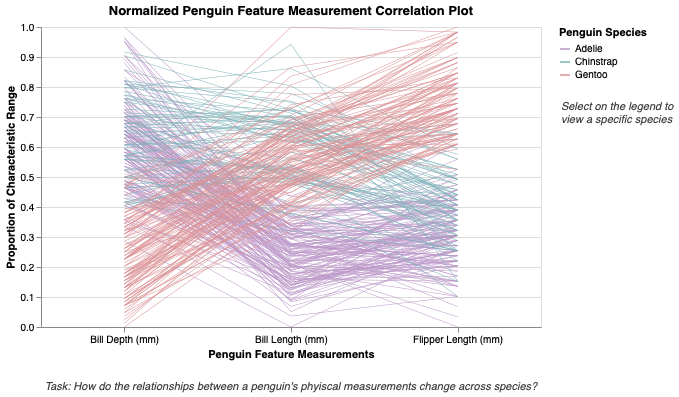

In [4]:
penguins_m2 = pd.read_csv('data/penguins_subset.csv')
species_colours = ['#BA95C7', '#7AB1B8', '#db9195']

parallel_coord_plot_selection = alt.selection_point(fields=['species'], bind='legend', )

parallel_coord_plot = alt.Chart(penguins_m2, width=500).transform_window(
    index='count()'
).transform_fold(
    ['bill length mm', 'bill depth mm', 'flipper length mm']
).transform_joinaggregate(
    min='min(value)',
    max='max(value)',
    groupby=['key']
).transform_calculate(
    minmax_value=(datum.value - datum.min) / (datum.max - datum.min),
    mid=(datum.min + datum.max) / 2,
).mark_line().encode(
    x=alt.X('key:N', title='Penguin Feature Measurements', 
            axis=alt.Axis(labelAngle=0, 
                          labelExpr = "datum.label === 'bill length mm' ? 'Bill Length (mm)' : (datum.label === 'bill depth mm' ? 'Bill Depth (mm)' : 'Flipper Length (mm)')")),
    y=alt.Y('minmax_value:Q', title='Proportion of Characteristic Range'),
    color=alt.Color('species', scale=alt.Scale(range=species_colours), title='Penguin Species').legend(),
    detail='index:N',
    opacity=alt.condition(parallel_coord_plot_selection, alt.value(1), alt.value(0.1)),
    size=alt.value(0.5),
).add_selection(
    parallel_coord_plot_selection
).properties(
    width = 500,
    height = 300,
    title = "Normalized Penguin Feature Measurement Correlation Plot")

parallel_coord_plot_task_text = alt.Chart().mark_text(
    fontStyle="italic",
    color=extra_text_color
).encode(
    y=alt.value(360),
    text=alt.value("Task: How do the relationships between a penguin's phyiscal measurements change across species?"),

)

parallel_coord_plot_legend_text = alt.Chart().mark_text(
    color=extra_text_color,
    lineBreak='\n',
    align='left',
    fontStyle='italics'
).encode(
    x=alt.value(520),
    y=alt.value(80),
    text=alt.value("Select on the legend to \nview a specific species"),

)
complete_parallel_cord = parallel_coord_plot + parallel_coord_plot_task_text + parallel_coord_plot_legend_text
complete_parallel_cord

## Task C - How have the diet of penguins impacted their health over time?

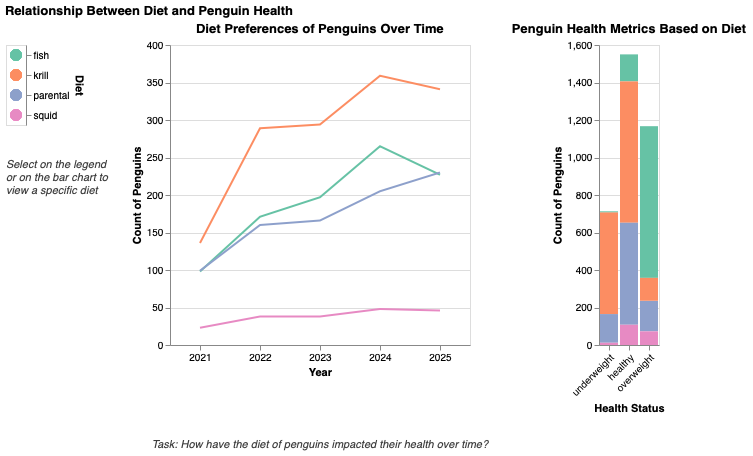

In [5]:
diets = ['fish', 'krill', 'parental', 'squid']
diets_label = ['Fish', 'Krill', 'Parental', 'Squid']
stage_radio = alt.binding_radio(
    options=life_stages, labels=labels, name='Life Stage: ')

diet_selection = alt.selection_point(
    fields=['diet']
)
color = alt.condition(
    diet_selection,
    alt.Color('diet:N').legend(None),
    alt.value('lightgray')
)

bar_color =  alt.condition(
    diet_selection,
    alt.Color('diet:N').scale(range=diet_colors),
    alt.value('black'))
    
diet_legend = alt.Chart(penguins).mark_circle(
    size=125).encode(
    alt.Y('diet:N').axis(orient='right').title('Diet'), 
    color=color
).add_params(
    diet_selection
)
health_options = ['underweight', 'healthy', 'overweight']
health_labels = ['Underweight', 'Healthy', 'Overweight']
health_radio = alt.binding_radio(
    options=health_options, labels=health_labels, name='Health Status: ')

health_selection = alt.selection_point(
    fields=['health metrics'], 
    bind=health_radio
)

bar_chart = alt.Chart(penguins).mark_bar().encode(
    x=alt.X('health metrics:O', sort=['underweight', 'healthy', 'overweight'], title='Health Status', axis = alt.Axis(labelAngle=-45)), 
    y = alt.Y('count()', scale=alt.Scale(domain=[0, 1600]), title='Count of Penguins'), 
    color=bar_color,
    tooltip = ['count()']
    ).transform_filter(diet_selection
                       ).add_params(diet_selection).properties(
        title="Penguin Health Metrics Based on Diet"
    )

line_chart = alt.Chart(penguins).mark_line().encode(
    x = alt.X('year:O', title='Year', axis = alt.Axis(labelAngle=0)), 
    y = alt.Y('count()', title='Count of Penguins'), 
    color = color, 
    tooltip = ['count()']
).properties(width=300, 
             title="Diet Preferences of Penguins Over Time")

diet_legend_text = alt.Chart().mark_text(
    color=extra_text_color,
    lineBreak='\n',
    align='left',
    fontStyle='italic'
).encode(
    x=alt.value(0),
    y=alt.value(120),
    text=alt.value("Select on the legend \nor on the bar chart to \nview a specific diet")
)

diet_plot_text = alt.Chart().mark_text(
    fontStyle="italic",
    color=extra_text_color
).encode(
    x=alt.value(150),
    y=alt.value(400),
    text=alt.value("Task: How have the diet of penguins impacted their health over time?"),
)

diet_plot = (diet_legend + diet_legend_text | diet_plot_text + line_chart | bar_chart).properties(title="Relationship Between Diet and Penguin Health")
diet_plot

## Task D - How does a penguins's prey vary across species and habitat?

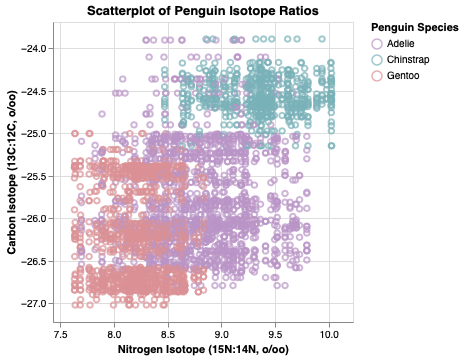

In [6]:
scatterplot_selection = alt.selection_interval()

scatterplot = alt.Chart(penguins).mark_point().encode(
    x = alt.X('delta 15 n (o/oo)').scale(domain = [penguins['delta 15 n (o/oo)'].min()-0.2,penguins['delta 15 n (o/oo)'].max()+0.2]).title('Nitrogen Isotope (15N:14N, o/oo)'),
    y = alt.Y('delta 13 c (o/oo)').scale(domain = [penguins['delta 13 c (o/oo)'].min()-0.2,penguins['delta 13 c (o/oo)'].max()+0.2]).title('Carbon Isotope (13C:12C, o/oo)'),
    color=alt.condition(scatterplot_selection, alt.Color('species:N', scale=alt.Scale(range=species_colours), title ='Penguin Species'), alt.value('lightgray'))
).add_selection(
    scatterplot_selection
).properties(
    width = 300,
    height = 300,
    title = 'Scatterplot of Penguin Isotope Ratios'
)

scatterplot

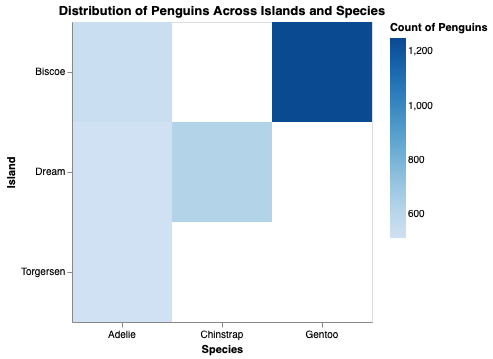

In [7]:
heatmap_selection = alt.selection_multi(encodings = ['x', 'y'])

heatmap = alt.Chart(penguins).mark_rect().encode(
    x = alt.X('species', axis = alt.Axis(labelAngle=0)).title('Species'),
    y = alt.Y('island').title('Island'),
    color = alt.condition(heatmap_selection, alt.Color('count():Q', scale=alt.Scale(scheme='blues'), title ='Count of Penguins'), alt.value('lightgrey')), 
    tooltip = ['count()']
).add_selection(
    heatmap_selection
).properties(
    height = 300,
    width = 300,
    title = 'Distribution of Penguins Across Islands and Species'
)

heatmap

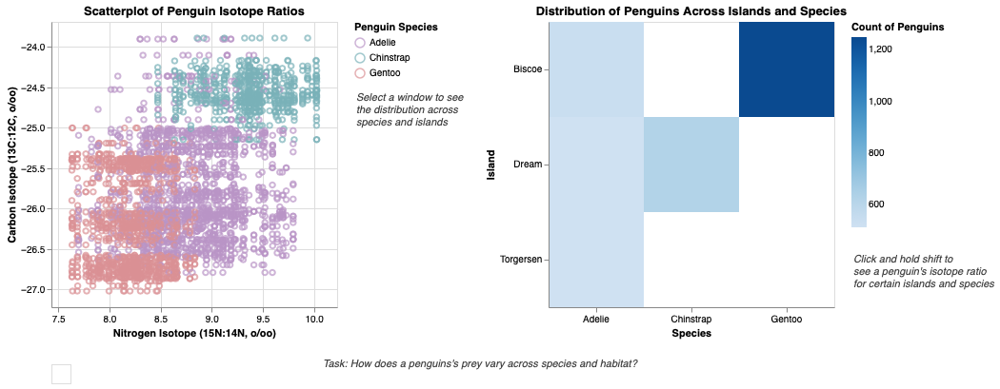

In [8]:
# combinining scatterplot and heatmap, as well as texts
scatterplot_legend_text = alt.Chart().mark_text(
    color=extra_text_color,
    lineBreak='\n',
    align='left',
    fontStyle='italic'
).encode(
    x=alt.value(320),
    y=alt.value(80),
    text=alt.value("Select a window to see \nthe distribution across \nspecies and islands"),

)

heatmap_legend_text = alt.Chart().mark_text(
    color=extra_text_color,
    lineBreak='\n',
    align='left',
    fontStyle='italic'
).encode(
    x=alt.value(320),
    y=alt.value(250),
    text=alt.value("Click and hold shift to \nsee a penguin's isotope ratio \nfor certain islands and species"),

)

scatter_heatmap_task = alt.Chart().mark_text(
    fontStyle="italic",
    color=extra_text_color
).encode(
    y=alt.value(0),
    x=alt.value(450),
    text=alt.value("Task: How does a penguins's prey vary across species and habitat?"),

)
full_scatterplot = scatterplot.transform_filter(heatmap_selection) + scatterplot_legend_text
full_heatmap = heatmap.transform_filter(scatterplot_selection) + heatmap_legend_text
complete_scatter_heatmap_plot = (full_scatterplot | full_heatmap) & scatter_heatmap_task
complete_scatter_heatmap_plot

## Dashboard

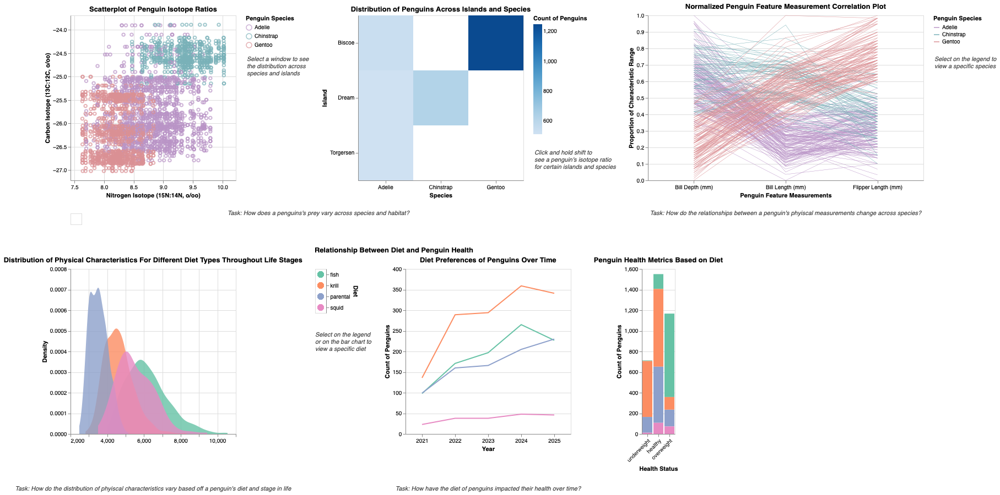

In [9]:
row1 = alt.hconcat(complete_scatter_heatmap_plot, complete_parallel_cord).resolve_scale(color='independent')
row2 = complete_density | diet_plot

dashboard = alt.vconcat(row1, row2, spacing = 40).resolve_scale(
    color = 'independent'
) 
dashboard